In [ ]:
!pip install tensorflow_hub
!pip install keras tf-models-official pydot graphviz

     |████████████████████████████████| 1.8 MB 5.3 MB/s 
     |████████████████████████████████| 43 kB 1.9 MB/s 
     |████████████████████████████████| 4.4 MB 24.1 MB/s 
     |████████████████████████████████| 99 kB 9.1 MB/s 
     |████████████████████████████████| 90 kB 9.4 MB/s 
     |████████████████████████████████| 1.2 MB 24.2 MB/s 
     |████████████████████████████████| 211 kB 47.4 MB/s 
     |████████████████████████████████| 352 kB 27.0 MB/s 
     |████████████████████████████████| 37.1 MB 49 kB/s 
     |████████████████████████████████| 1.1 MB 40.3 MB/s 
     |████████████████████████████████| 636 kB 40.1 MB/s 
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=516b598fb2d0b1ba7888a48c466a3c951fca447e5273097f2ed576b40ccd8584
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for seqeval: filename=seqeval-1.2.2-py3-none-any.whl size=16181 sha256=6e1f8910bc5acda492

In [ ]:
import os

import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub

from keras.utils import np_utils

import official.nlp.bert.bert_models
import official.nlp.bert.configs
import official.nlp.bert.run_classifier
import official.nlp.bert.tokenization as tokenization

from official.modeling import tf_utils
from official import nlp
from official.nlp import bert

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

1 Physical GPUs, 1 Logical GPUs
Version:  2.6.0
Eager mode:  True
Hub version:  0.12.0
GPU is available


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/DATA/training.1600000.processed.noemoticon.csv',
                 encoding='ISO-8859-1', 
                 names=[
                        'target',
                        'id',
                        'date',
                        'flag',
                        'user',
                        'text'
                        ])

In [ ]:
df.head()

,target,id,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


In [ ]:
df.target.value_counts()

4    800000
0    800000
Name: target, dtype: int64

In [ ]:
sample_size = int(len(df)*0.05)
sampleDf = df.sample(sample_size, random_state=23)
x = sampleDf.text.values
y = sampleDf.target.values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=32)

In [ ]:
print(x_train[:2])
print(y_train)

['I FOUND OUT THAT THEY PAY THE WHITE CHICK MORE THAN ME  WHY?? I DONT KNOW!!! WHAT SHOULD I DO???'
 "@nickheppleston It's an enlightening experience, isn't it? "]
[0 4 4 ... 4 0 4]


In [ ]:
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y_test = encoder.transform(y_test)
encoded_Y_train = encoder.transform(y_train)

In [ ]:
# convert integers to dummy variables (i.e. one hot encoded)
dummy_y_test = np_utils.to_categorical(encoded_Y_test)
dummy_y_train = np_utils.to_categorical(encoded_Y_train)

In [ ]:
dummy_y_train[:5]

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.]], dtype=float32)

In [ ]:
encoder_fname = 'twitter_classes.npy'
my_wd = '/content/drive/MyDrive/DATA/'
np.save(os.path.join(my_wd, encoder_fname) , encoder.classes_)

In [ ]:
bert_layer = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/2",
                            trainable=True)

In [ ]:
vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()
do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()
tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

In [ ]:
do_lower_case

False

In [ ]:
tokenizer.convert_tokens_to_ids(['[CLS]', '[SEP]'])

[101, 102]

In [ ]:
print(tokenizer.vocab)

OrderedDict([('[PAD]', 0), ('[unused1]', 1), ('[unused2]', 2), ('[unused3]', 3), ('[unused4]', 4), ('[unused5]', 5), ('[unused6]', 6), ('[unused7]', 7), ('[unused8]', 8), ('[unused9]', 9), ('[unused10]', 10), ('[unused11]', 11), ('[unused12]', 12), ('[unused13]', 13), ('[unused14]', 14), ('[unused15]', 15), ('[unused16]', 16), ('[unused17]', 17), ('[unused18]', 18), ('[unused19]', 19), ('[unused20]', 20), ('[unused21]', 21), ('[unused22]', 22), ('[unused23]', 23), ('[unused24]', 24), ('[unused25]', 25), ('[unused26]', 26), ('[unused27]', 27), ('[unused28]', 28), ('[unused29]', 29), ('[unused30]', 30), ('[unused31]', 31), ('[unused32]', 32), ('[unused33]', 33), ('[unused34]', 34), ('[unused35]', 35), ('[unused36]', 36), ('[unused37]', 37), ('[unused38]', 38), ('[unused39]', 39), ('[unused40]', 40), ('[unused41]', 41), ('[unused42]', 42), ('[unused43]', 43), ('[unused44]', 44), ('[unused45]', 45), ('[unused46]', 46), ('[unused47]', 47), ('[unused48]', 48), ('[unused49]', 49), ('[unused50

In [ ]:
def encode_names(n):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')  # seperation token. Would bemuch more useful if you had a multiple text input.
   return tokenizer.convert_tokens_to_ids(tokens)

tweets = tf.ragged.constant([
    encode_names(n) for n in x_train])

In [ ]:
print(encode_names("I love you"))
print(encode_names("bvf vjd ìnvkgdj"))
print(encode_names("picture-perfect you don't need attention"))
print(encode_names("picture-perfect you dont need attention"))

[146, 16138, 13028, 102]
[170, 10477, 10575, 190, 31134, 266, 10115, 10477, 47407, 10162, 10418, 102]
[36761, 118, 43477, 13028, 16938, 112, 188, 17367, 21341, 102]
[36761, 118, 43477, 13028, 11758, 17367, 21341, 102]


In [ ]:
print('Tokenized Tweets shape', tweets.shape.as_list())

Tokenized Tweets shape [64000, None]


In [ ]:
x_train[0]

'I FOUND OUT THAT THEY PAY THE WHITE CHICK MORE THAN ME  WHY?? I DONT KNOW!!! WHAT SHOULD I DO???'

In [ ]:
tokenizedTweet = tokenizer.tokenize(x_train[0])
for i in tokenizedTweet:
  print(i, tokenizer.convert_tokens_to_ids([i]))

I [146]
F [143]
##O [11403]
##UN [69849]
##D [11490]
O [152]
##UT [65729]
T [157]
##HA [58132]
##T [11090]
THE [17443]
##Y [14703]
PA [32349]
##Y [14703]
THE [17443]
W [160]
##HI [108880]
##TE [29833]
CH [39774]
##IC [30889]
##K [11733]
MO [102059]
##RE [66014]
T [157]
##HA [58132]
##N [11537]
ME [47430]
W [160]
##H [12396]
##Y [14703]
? [136]
? [136]
I [146]
DO [99843]
##NT [77261]
K [148]
##NO [67292]
##W [13034]
! [106]
! [106]
! [106]
W [160]
##HA [58132]
##T [11090]
SH [38702]
##O [11403]
##UL [100673]
##D [11490]
I [146]
DO [99843]
? [136]
? [136]
? [136]


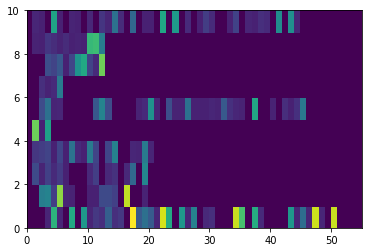

In [ ]:
cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*tweets.shape[0]
input_word_ids = tf.concat([cls, tweets], axis=-1)
_ = plt.pcolormesh(input_word_ids[0:10].to_tensor())

In [ ]:
input_word_ids

<tf.RaggedTensor [[101, 146, 143, 11403, 69849, 11490, 152, 65729, 157, 58132, 11090, 17443, 14703, 32349, 14703, 17443, 160, 108880, 29833, 39774, 30889, 11733, 102059, 66014, 157, 58132, 11537, 47430, 160, 12396, 14703, 136, 136, 146, 99843, 77261, 148, 67292, 13034, 106, 106, 106, 160, 58132, 11090, 38702, 11403, 100673, 11490, 146, 99843, 136, 136, 136, 102], [101, 137, 46267, 48502, 19986, 90467, 11183, 10377, 112, 187, 10151, 10110, 24310, 24428, 20627, 117, 98370, 112, 188, 10271, 136, 102], [101, 24309, 10911, 20442, 12842, 18957, 10107, 119, 119, 119, 12489, 19838, 136, 12489, 15457, 136, 12489, 36216, 146, 49866, 136, 102], [101, 17116, 19556, 21937, 10155, 22329, 10114, 41573, 12935, 10135, 44841, 21997, 119, 22329, 47798, 112, 188, 11850, 10911, 44841, 11426, 136, 102], [101, 84532, 10105, 62431, 102], [101, 145, 25054, 39999, 10858, 11733, 106, 106, 106, 106, 106, 29639, 49307, 25054, 106, 106, 106, 106, 10529, 13028, 55233, 10911, 136, 25641, 10393, 10590, 40840, 10112, 1

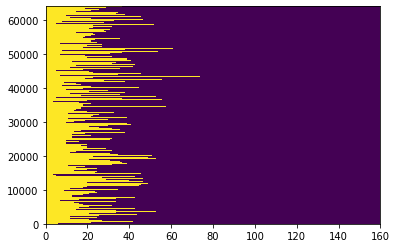

In [ ]:
input_mask = tf.ones_like(input_word_ids).to_tensor()

plt.pcolormesh(input_mask)

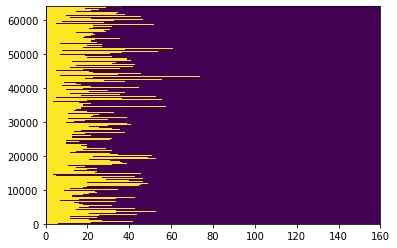

In [ ]:
type_cls = tf.zeros_like(cls)
type_tweet = tf.ones_like(tweets)
input_type_ids = tf.concat([type_cls, type_tweet], axis=-1).to_tensor()

plt.pcolormesh(input_type_ids)

In [ ]:
input_type_ids

<tf.Tensor: shape=(64000, 160), dtype=int32, numpy=
array([[0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0]], dtype=int32)>

In [ ]:
lens = [len(i) for i in input_word_ids]

In [ ]:
max_seq_length = max(lens)
print('Max length is:', max_seq_length)

Max length is: 160


In [ ]:
max_seq_length = int(1.5*max_seq_length)
print('Max length is:', max_seq_length)

Max length is: 240


In [ ]:
def encode_names(n, tokenizer):
   tokens = list(tokenizer.tokenize(n))
   tokens.append('[SEP]')
   return tokenizer.convert_tokens_to_ids(tokens)

def bert_encode(string_list, tokenizer, max_seq_length):
  num_examples = len(string_list)
  
  string_tokens = tf.ragged.constant([
      encode_names(n, tokenizer) for n in np.array(string_list)])

  cls = [tokenizer.convert_tokens_to_ids(['[CLS]'])]*string_tokens.shape[0]
  input_word_ids = tf.concat([cls, string_tokens], axis=-1)

  input_mask = tf.ones_like(input_word_ids).to_tensor(shape=(None, max_seq_length))

  type_cls = tf.zeros_like(cls)
  type_tokens = tf.ones_like(string_tokens)
  input_type_ids = tf.concat(
      [type_cls, type_tokens], axis=-1).to_tensor(shape=(None, max_seq_length))

  inputs = {
      'input_word_ids': input_word_ids.to_tensor(shape=(None, max_seq_length)),
      'input_mask': input_mask,
      'input_type_ids': input_type_ids}

  return inputs

In [ ]:
X_train = bert_encode(x_train, tokenizer, max_seq_length)
X_test = bert_encode(x_test, tokenizer, max_seq_length)

In [ ]:
num_class = len(encoder.classes_)  # Based on available class selection
max_seq_length = max_seq_length  # we calculated this a couple cells ago

input_word_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                       name="input_word_ids")
input_mask = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                   name="input_mask")
segment_ids = tf.keras.layers.Input(shape=(max_seq_length,), dtype=tf.int32,
                                    name="segment_ids")

pooled_output, sequence_output = bert_layer([input_word_ids, input_mask, segment_ids])                                  

output = tf.keras.layers.Dropout(rate=0.1)(pooled_output)

output = tf.keras.layers.Dense(num_class, activation='softmax', name='output')(output)

model = tf.keras.Model(
    inputs={
        'input_word_ids': input_word_ids,
        'input_mask': input_mask,
        'input_type_ids': segment_ids
        },
        outputs=output)

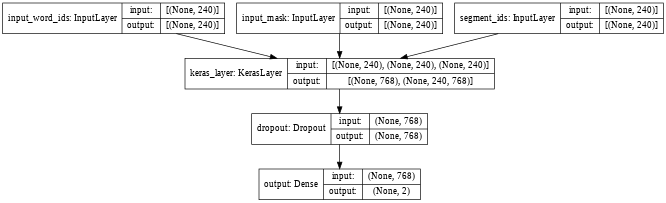

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=48)

In [ ]:
epochs = 3
batch_size = 16  # select based on your GPU resources
eval_batch_size = batch_size

train_data_size = len(dummy_y_train)
steps_per_epoch = int(train_data_size / batch_size)
num_train_steps = steps_per_epoch * epochs
warmup_steps = int(epochs * train_data_size * 0.1 / batch_size)

optimizer = nlp.optimization.create_optimizer(
    2e-5, num_train_steps=num_train_steps, num_warmup_steps=warmup_steps)

In [ ]:
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_word_ids (InputLayer)     [(None, 240)]        0                                            
__________________________________________________________________________________________________
input_mask (InputLayer)         [(None, 240)]        0                                            
__________________________________________________________________________________________________
segment_ids (InputLayer)        [(None, 240)]        0                                            
__________________________________________________________________________________________________
keras_layer (KerasLayer)        [(None, 768), (None, 177853441   input_word_ids[0][0]             
                                                                 input_mask[0][0]             

In [ ]:
history = model.fit(X_train,
                    dummy_y_train,
                    epochs=1,
                    batch_size=batch_size,
                    validation_data=(X_test, dummy_y_test),
                    verbose=1)

In [ ]:
history

In [ ]:
model.save("/content/drive/MyDrive/DATA/bert_model")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/DATA/bert_model/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/DATA/bert_model/assets


In [ ]:
from tensorflow import keras
bert_model = keras.models.load_model("/content/drive/MyDrive/DATA/bert_model")

In [ ]:
# loss, accuracy = model.evaluate(X_train, dummy_y_train, verbose=True)
# print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_test, dummy_y_test, verbose=True)
print("Testing Accuracy:  {:.4f}".format(accuracy))

500/500 [==============================] - 536s 1s/step - loss: 0.4224 - accuracy: 0.8123
Testing Accuracy:  0.8123
